In [1]:
# Importing all necessary librabies:

import pandas as pd # To Work with data
import numpy as np 
import matplotlib.pyplot as plt # Visualization
import seaborn as sns # Visualization
pd.set_option('display.max_columns',500) # Maximum number of columns that can apear on screen.

import plotly.express as px # Visualization
from wordcloud import WordCloud, STOPWORDS # Creating WordCloud
import plotly.graph_objects as go # Visualization

In [2]:
df = pd.read_csv("Data\\Chicago Crime Data\\Crimes_2001_to_present_sample.csv") #loding data.

In [3]:
df.shape # Shape of data

(62833, 23)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62833 entries, 0 to 62832
Data columns (total 23 columns):
Unnamed: 0              62833 non-null int64
ID                      62833 non-null int64
Case Number             62833 non-null object
Date                    62833 non-null object
Block                   62833 non-null object
IUCR                    62833 non-null object
Primary Type            62833 non-null object
Description             62833 non-null object
Location Description    62811 non-null object
Arrest                  62833 non-null bool
Domestic                62833 non-null bool
Beat                    62833 non-null int64
District                62833 non-null int64
Ward                    56698 non-null float64
Community Area          56685 non-null float64
FBI Code                62833 non-null object
X Coordinate            62096 non-null float64
Y Coordinate            62096 non-null float64
Year                    62833 non-null int64
Updated On            

In [5]:
df.sample(5).head() # A sneak peak into data

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
62287,1752501,6474450,HP551904,09-03-2008 21:30,044XX N ELSTON AVE,820,THEFT,$500 AND UNDER,SIDEWALK,True,False,1722,17,39.0,14.0,6,1148240.0,1929101.0,2008,02-04-2016 06:33,41.961400,-87.730379,"(41.9614, -87.730379)"
24314,5032094,3849403,HL222657,03-08-2005 15:07,001XX S PULASKI RD,460,BATTERY,SIMPLE,LIBRARY,False,False,1122,11,28.0,26.0,08B,1149746.0,1899192.0,2005,04/15/2016 08:55:02 AM,41.879298,-87.725621,"(41.879298, -87.725621)"
2455,2297807,7465367,HS267499,04/20/2010 06:18:00 PM,079XX S HALSTED ST,1330,CRIMINAL TRESPASS,TO LAND,SMALL RETAIL STORE,True,False,621,6,17.0,71.0,26,1172345.0,1852238.0,2010,02-04-2016 06:33,41.749982,-87.644025,"(41.749982, -87.644025)"
8801,3092235,4516105,HM104598,12/22/2005 05:00:00 PM,122XX S LA SALLE ST,1150,DECEPTIVE PRACTICE,CREDIT CARD FRAUD,RESIDENCE,False,False,523,5,9.0,53.0,11,1177477.0,1823750.0,2005,04/15/2016 08:55:02 AM,41.671693,-87.626076,"(41.671693, -87.626076)"
48341,4516360,9897269,HX547525,12/18/2014 10:00:00 PM,048XX W WALTON ST,281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,ALLEY,False,False,1531,15,37.0,25.0,2,1143878.0,1905870.0,2014,02-04-2016 06:33,41.897735,-87.747000,"(41.897735, -87.747)"


### Date attribute contains date of crime. It is in string format, convert it into datetime object would be more convenient.

In [6]:
df['Date'] = pd.to_datetime(df['Date']) # Converting string object to date_time object.

In [7]:
df.isnull().sum() # Look at the number of null values each attribute(column) has.

Unnamed: 0                 0
ID                         0
Case Number                0
Date                       0
Block                      0
IUCR                       0
Primary Type               0
Description                0
Location Description      22
Arrest                     0
Domestic                   0
Beat                       0
District                   0
Ward                    6135
Community Area          6148
FBI Code                   0
X Coordinate             737
Y Coordinate             737
Year                       0
Updated On                 0
Latitude                 737
Longitude                737
Location                 737
dtype: int64

In [8]:
# Number of unique entries in each column :
for i in df.columns :
    print(i + ' :', len(df[i].unique()))

Unnamed: 0 : 62833
ID : 62833
Case Number : 62833
Date : 60387
Block : 22574
IUCR : 302
Primary Type : 29
Description : 280
Location Description : 103
Arrest : 2
Domestic : 2
Beat : 302
District : 22
Ward : 51
Community Area : 79
FBI Code : 25
X Coordinate : 31824
Y Coordinate : 37664
Year : 17
Updated On : 743
Latitude : 49051
Longitude : 49032
Location : 49091


### Ward and Community area has very high number of null values, we cannot gether meaningful insights from these. It's better that we drop these.

In [9]:
df.drop(columns=['Ward','Community Area'], inplace=True)

### Let's see the crime distribution with time.

In [10]:
temp = df.groupby(by='Year')['ID'].count()
temp = pd.DataFrame(temp).reset_index()

import plotly.graph_objects as go
fig = go.Figure(data=go.Scatter(x=temp['Year'], y=temp['ID']))
fig.update_layout(title='Crimes per Year',
                   xaxis_title='Year',
                   yaxis_title='Total Crimes')
fig.show()

In [11]:
df['Month'] = df['Date'].apply(lambda x : x.month)
months = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun'
         ,7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}

In [12]:
temp = df.groupby(by='Month')['ID'].count()
temp = pd.DataFrame(temp).reset_index()
temp.sort_values(by='Month')

temp['Month'] = temp['Month'].map(months)

fig = go.Figure(data=go.Scatter(x=temp['Month'], y=temp['ID']))
fig.update_layout(title='Crimes by Month',
                   xaxis_title='Month',
                   yaxis_title='Total Crimes')
fig.show()

#### Looking at the above graph, we can see that most crimes are done in the summers.

In [13]:
temp = df.groupby(by='Year')['ID'].count()
temp = pd.DataFrame(temp).reset_index()
for i in range(1,len(temp)-1) :
    temp.loc[i,'Change_Percent'] = (temp.loc[i,'ID']-temp.loc[i-1,'ID'])/temp.loc[i-1,'ID']
temp.fillna(0,inplace=True)


fig = px.bar(temp, 'Year', 'Change_Percent', color='Change_Percent', height=400, title='Percentage Change in crime rates per year')
del temp
fig.show()

### Below graph shows shares of primary cime types in total crimes that took place in chicago over these years.

In [14]:
temp = df.groupby(by='Primary Type')['ID'].count()
temp = pd.DataFrame(temp).reset_index()

fig = go.Figure(data=[go.Pie(labels=temp['Primary Type'], values=temp['ID'])])
fig.update_traces(textinfo='label', textfont_size=10)
fig.update_layout(title_text='Primary Type')
fig.show()

del temp

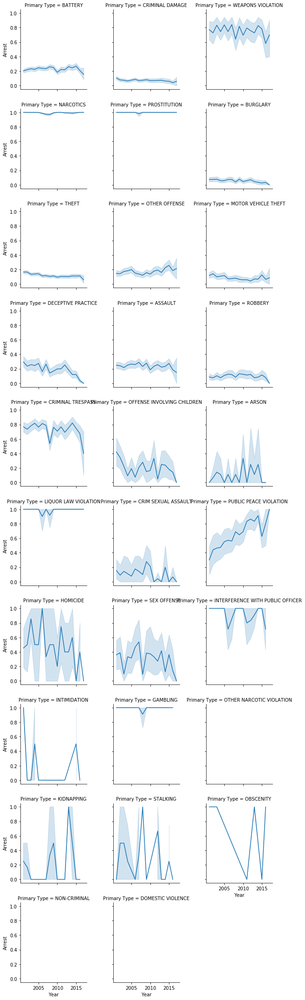

In [15]:
fc = sns.FacetGrid(df, col='Primary Type', col_wrap=3)
fc.map(sns.lineplot, 'Year', 'Arrest')


### Below is a wordcloud of most frequent words used in crime descriptions.

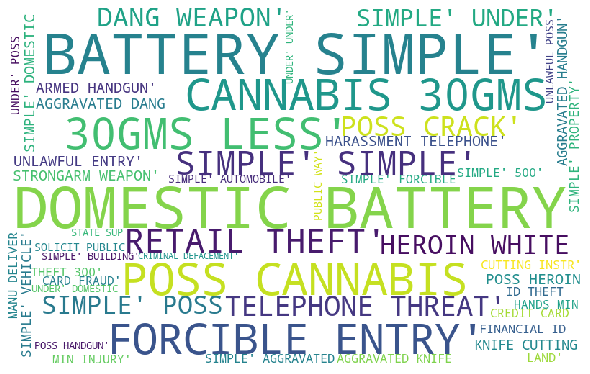

In [16]:
Description = ''.join(str(df['Description'].to_list()))

cloud = WordCloud(height=500, width=800, stopwords=STOPWORDS, background_color='white', max_words=50).generate(Description)

plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
del Description, cloud

### Below is a wordcloud of most frequent words used in location descriptions.

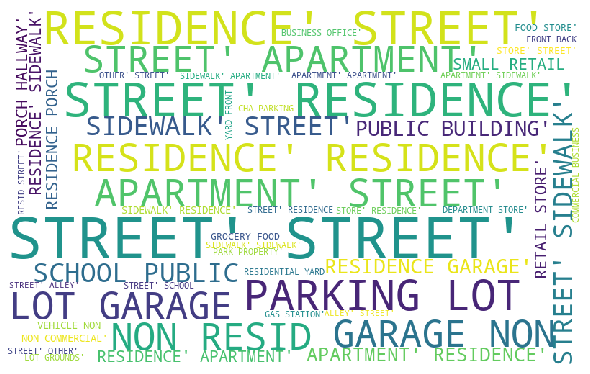

In [17]:
Description = ''.join(str(df['Location Description'].to_list()))

cloud = WordCloud(height=500, width=800, stopwords=STOPWORDS, background_color='white', max_words=50).generate(Description)

plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
del Description, cloud

### Number of crimes in districs.

In [18]:
temp = pd.DataFrame(df.groupby(by='District')['ID'].count()).reset_index()
px.bar(temp, 'District', 'ID', height=400, color='ID', labels={'ID':'Crimes'})

### Total crimes and arrests by district.

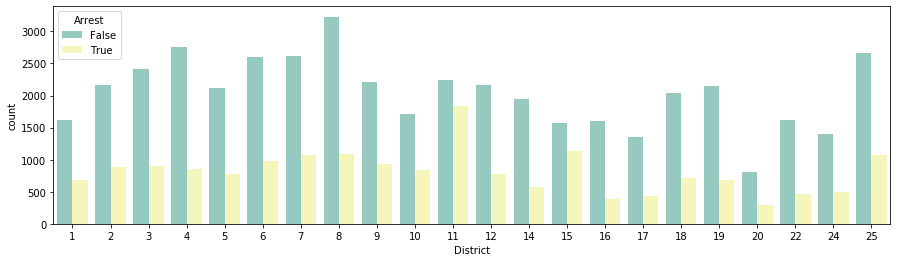

In [19]:
plt.figure(figsize=(15,4))
sns.countplot(data=df, x='District', hue='Arrest', palette="Set3")

### how many times is it an arrest in crime

In [20]:
fig = go.Figure(data=[go.Pie(labels=df['Arrest'])])
fig.update_traces(textinfo='label', textfont_size=20, marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Arrests:')
fig.show()

### Blocks with most crimes.

In [21]:
temp = df.groupby(by='Block')['ID'].count().sort_values(ascending=False).head(5)
temp = pd.DataFrame(temp).reset_index()
px.bar(temp, 'Block', 'ID', labels={'ID':'Crimes'}, title='Blocks with most crimes', height=400)

### How much of crimes are domestic.

In [22]:
fig = go.Figure(data=[go.Pie(labels=df['Domestic'])])
fig.update_traces(textfont_size=20, marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Domestic:')
fig.show()

### Let's see it on map

In [23]:
fig = px.scatter_mapbox(df, 'Latitude', 'Longitude')

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()